In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
import os

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split 
from sklearn import linear_model, preprocessing 

In [2]:
dfg = pd.read_csv('Data.csv')
dfe = dfg[dfg['genre'] != 'Pop']
df = dfg[dfg['genre'] == 'Pop']

In [3]:
df.describe()

,Unnamed: 0,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,...,duration_ms_zscore,energy_zscore,instrumentalness_zscore,liveness_zscore,loudness_zscore,speechiness_zscore,tempo_zscore,valence_zscore,lognorm_duration_zscore,Count_zscore
count,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,...,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000,9386.000000
mean,29174.394950,66.590667,0.224819,0.640236,220859.160239,0.642208,0.016599,0.179967,-6.495423,0.107963,...,-0.134987,0.235023,-0.412762,-0.176019,0.481273,-0.077737,0.122191,0.143213,-0.039129,-0.142992
std,8501.963593,7.248797,0.250306,0.141266,46591.265411,0.182855,0.094935,0.135340,2.715295,0.105474,...,0.399313,0.701733,0.324623,0.687088,0.457045,0.566260,0.934456,0.881095,0.534662,0.496716
min,12708.000000,3.000000,0.000006,0.130000,21547.000000,0.009930,0.000000,0.015700,-29.729000,0.022500,...,-1.843204,-2.191440,-0.469522,-1.009958,-3.429458,-0.536564,-2.537284,-1.633124,-6.049109,-0.617885
25%,30236.250000,62.000000,0.029200,0.546000,191967.750000,0.520000,0.000000,0.097200,-7.750000,0.038400,...,-0.382603,-0.233970,-0.469522,-0.596204,0.270100,-0.451201,-0.632279,-0.547363,-0.349849,-0.494859
50%,32582.500000,66.000000,0.120000,0.648500,215279.000000,0.658000,0.000000,0.124000,-6.028000,0.058900,...,-0.182812,0.295626,-0.469522,-0.460147,0.559951,-0.341142,0.084426,0.086945,-0.051198,-0.293545
75%,34928.750000,71.000000,0.348000,0.743000,242303.500000,0.785000,0.000045,0.221000,-4.705000,0.137000,...,0.048803,0.783008,-0.469368,0.032297,0.782642,0.078156,0.735621,0.802498,0.256962,0.047572
max,37275.000000,100.000000,0.995000,0.971000,723573.000000,0.993000,0.972000,0.962000,0.634000,0.883000,...,4.173554,1.581239,2.854170,3.794160,1.681315,4.083229,3.144234,2.091668,3.107803,2.043944


In [4]:
cols = df.columns

allpop = dfe[dfe.popular == 'popular']
pop = df[df.popular == 'popular']
nonpop = df[df.popular == 'not-popular']
print(df.corr())


AxesSubplot(0.125,0.125;0.62x0.755)


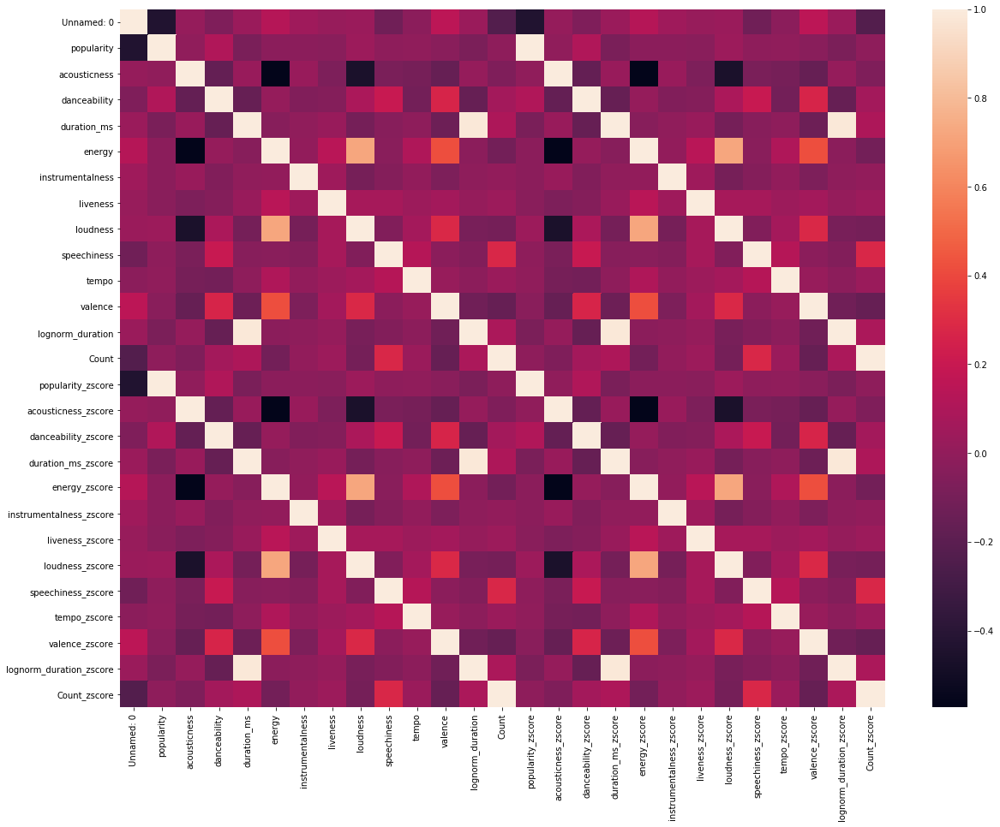

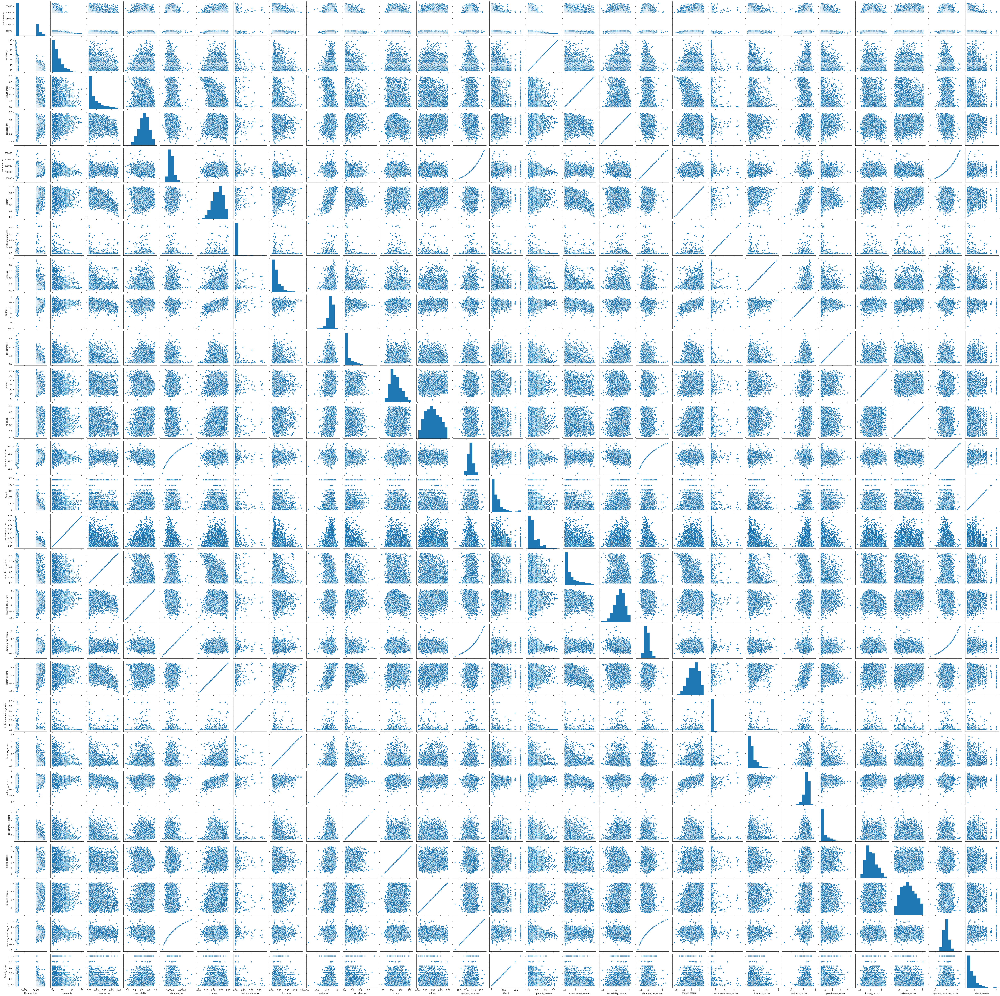

In [5]:
plt.subplots(figsize=(20,15))

m = sns.heatmap(pop.corr())
print(m)
n = sns.pairplot(data=pop)
print(n)


<ErrorbarContainer object of 3 artists>

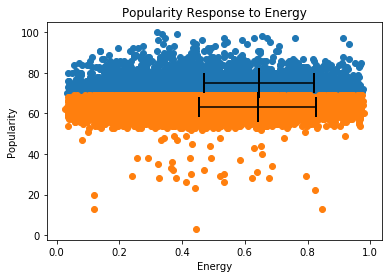

In [6]:
plt.scatter(pop.valence, pop.popularity)
plt.scatter(nonpop.valence, nonpop.popularity)
plt.xlabel("Energy")
plt.ylabel("Popularity")
plt.title("Popularity Response to Energy")

plt.errorbar(np.mean(pop.energy),np.mean(pop.popularity),xerr=np.std(pop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.energy),np.mean(nonpop.popularity),xerr=np.std(nonpop.energy),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

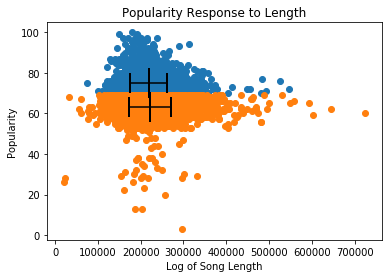

In [7]:
plt.scatter(pop.duration_ms, pop.popularity)
plt.scatter(nonpop.duration_ms, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Length")

plt.errorbar(np.mean(pop.duration_ms),np.mean(pop.popularity),xerr=np.std(pop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.duration_ms),np.mean(nonpop.popularity),xerr=np.std(nonpop.duration_ms),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

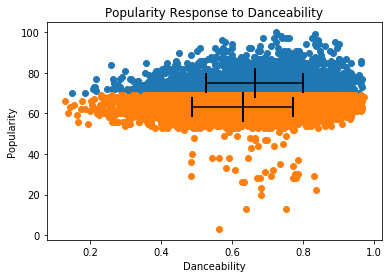

In [8]:
plt.scatter(pop.danceability, pop.popularity)
plt.scatter(nonpop.danceability, nonpop.popularity)
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.title("Popularity Response to Danceability")

plt.errorbar(np.mean(pop.danceability),np.mean(pop.popularity),xerr=np.std(pop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.danceability),np.mean(nonpop.popularity),xerr=np.std(nonpop.danceability),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

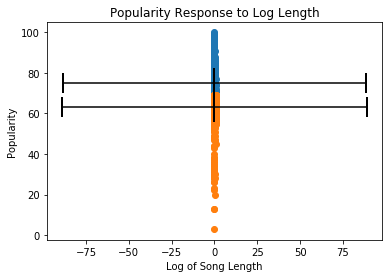

In [9]:
plt.scatter(pop.instrumentalness, pop.popularity)
plt.scatter(nonpop.instrumentalness, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Log Length")

plt.errorbar(np.mean(pop.instrumentalness),np.mean(pop.popularity),xerr=np.std(pop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.instrumentalness),np.mean(nonpop.popularity),xerr=np.std(nonpop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

<ErrorbarContainer object of 3 artists>

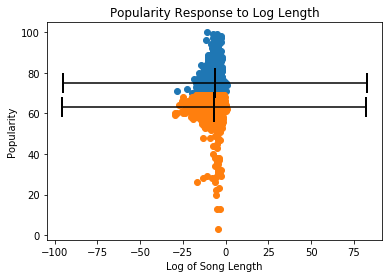

In [10]:
plt.scatter(pop.loudness, pop.popularity)
plt.scatter(nonpop.loudness, nonpop.popularity)
plt.xlabel("Log of Song Length")
plt.ylabel("Popularity")
plt.title("Popularity Response to Log Length")

plt.errorbar(np.mean(pop.loudness),np.mean(pop.popularity),xerr=np.std(pop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')
plt.errorbar(np.mean(nonpop.loudness),np.mean(nonpop.popularity),xerr=np.std(nonpop.Count),fmt='|', ms=30,mew=2,capthick=2,capsize=10,color='black')

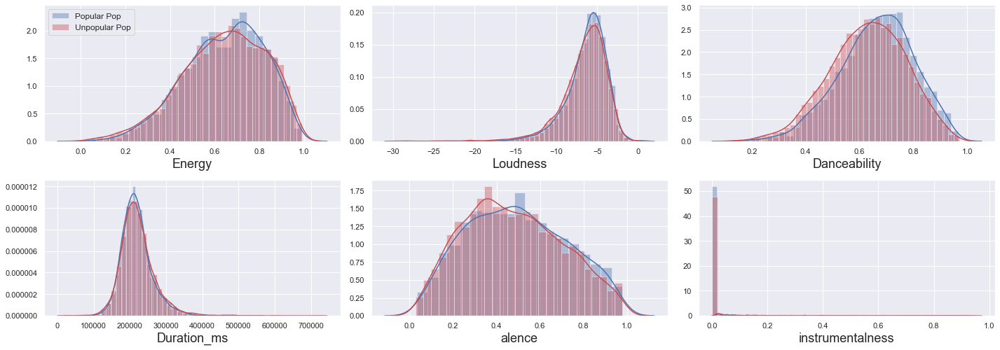

In [18]:
plt.figure(figsize=(20,10))
sns.set()
plt.subplot(331)
sns.distplot(pop.energy, label='Popular Pop')
sns.distplot(nonpop.energy, color='r', label='Unpopular Pop')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(332)
sns.distplot(pop.loudness)
sns.distplot(nonpop.loudness, color='r')
plt.xlabel('Loudness', fontsize=18)

plt.subplot(333)
sns.distplot(pop.danceability)
sns.distplot(nonpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(334)
sns.distplot(pop.duration_ms)
sns.distplot(nonpop.duration_ms, color='r')
plt.xlabel('Duration_ms', fontsize=18)

plt.subplot(335)
sns.distplot(pop.valence)
sns.distplot(nonpop.valence, color='r')
plt.xlabel('Valence', fontsize=18)

plt.subplot(336)
sns.distplot(pop.instrumentalness)
sns.distplot(nonpop.instrumentalness, color='r')
plt.xlabel('Instrumentalness', fontsize=18)

plt.tight_layout()
plt.show()


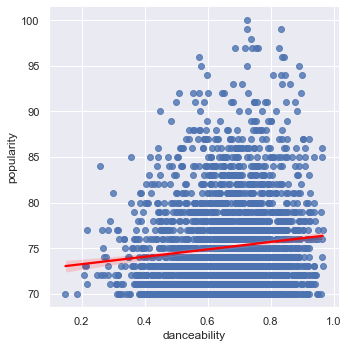

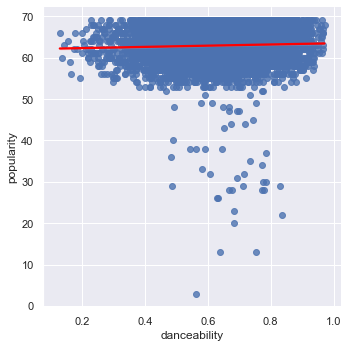

In [12]:
n = sns.lmplot(x='danceability',y='popularity',data=pop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='danceability',y='popularity',data=nonpop,line_kws={'color': 'red'})
print(p)


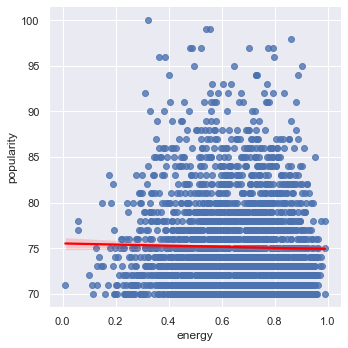

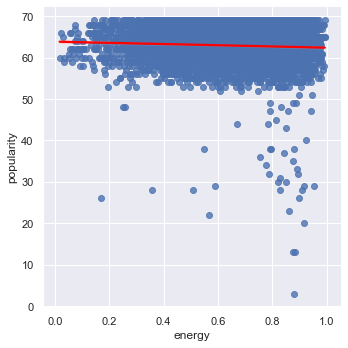

In [13]:
n = sns.lmplot(x='energy',y='popularity',data=pop,line_kws={'color': 'red'})
print(n)
p = sns.lmplot(x='energy',y='popularity',data=nonpop,line_kws={'color': 'red'})
print(p)


Popular pop songs have a positive cooreltion between popularity and danceability, whereas unpoplar ones don't.

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


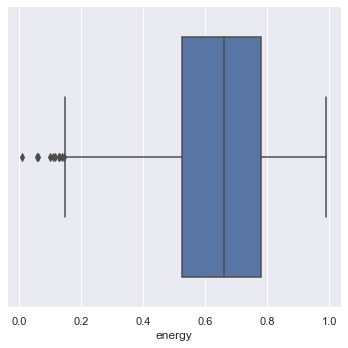

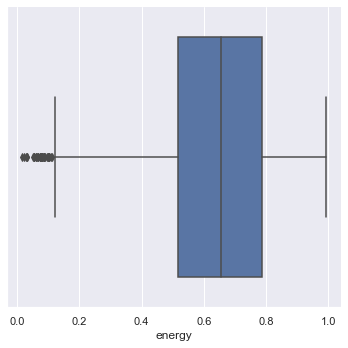

In [14]:
sns.factorplot(x='energy', data=pop, kind='box')


sns.factorplot(x='energy', data=nonpop, kind='box')
plt.show()

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


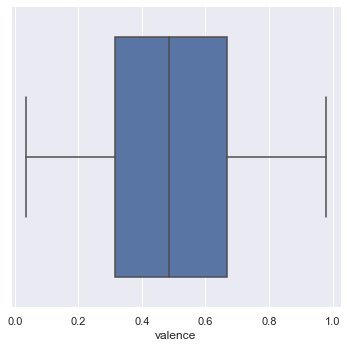

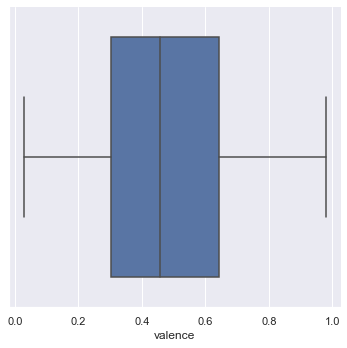

In [15]:
sns.factorplot(x='valence', data=pop, kind='box')


sns.factorplot(x='valence', data=nonpop, kind='box')
plt.show()

/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/nicholasseguljic/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


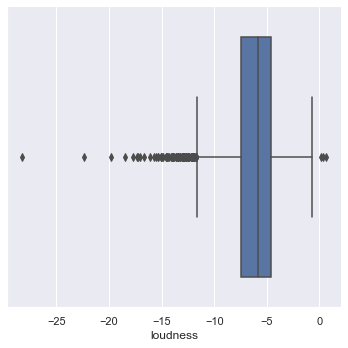

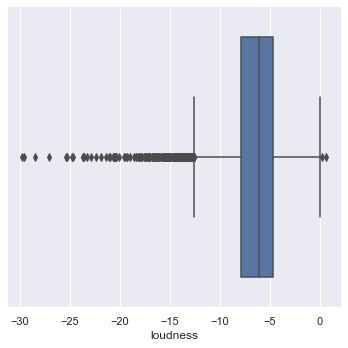

In [16]:
sns.factorplot(x='loudness', data=pop, kind='box')


sns.factorplot(x='loudness', data=nonpop, kind='box')
plt.show()

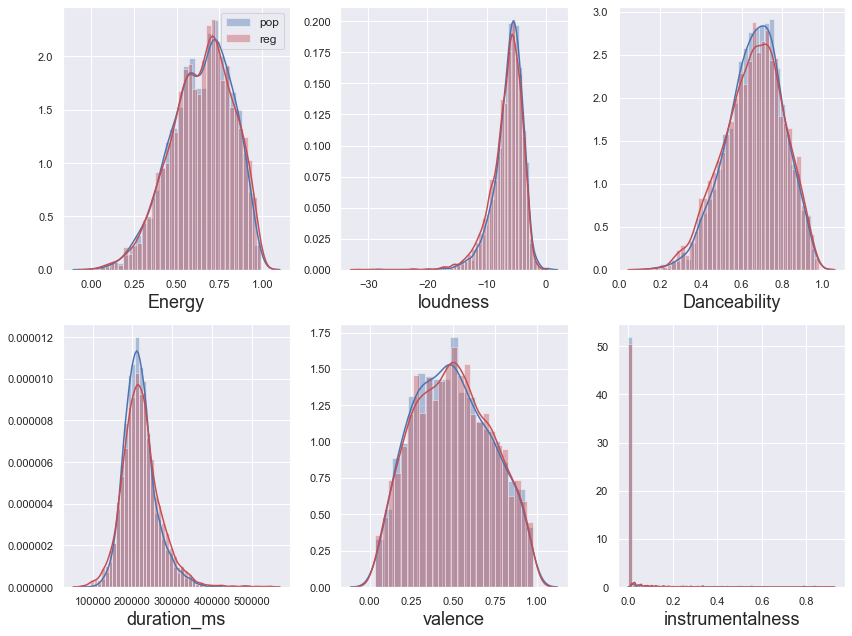

In [17]:
plt.figure(figsize=(20,10))
sns.set()

plt.subplot(231)
sns.distplot(pop.energy, label='Pop')
sns.distplot(allpop.energy, color='r', label='Other Music')
plt.xlabel('Energy', fontsize=18)
plt.legend(fontsize=12)

plt.subplot(232)
sns.distplot(pop.loudness)
sns.distplot(allpop.loudness, color='r')
plt.xlabel('Loudness', fontsize=18)

plt.subplot(233)
sns.distplot(pop.danceability)
sns.distplot(allpop.danceability, color='r')
plt.xlabel('Danceability', fontsize=18)

plt.subplot(234)
sns.distplot(pop.duration_ms)
sns.distplot(allpop.duration_ms, color='r')
plt.xlabel('Duration_ms', fontsize=18)

plt.subplot(235)
sns.distplot(pop.valence)
sns.distplot(allpop.valence, color='r')
plt.xlabel('Valence', fontsize=18)

plt.subplot(236)
sns.distplot(pop.instrumentalness)
sns.distplot(allpop.instrumentalness, color='r')
plt.xlabel('Instrumentalness', fontsize=18)



plt.tight_layout()
plt.show()
